# Лабораторная работа №2
## Кластеризация методом K-means
### Датасет: Instagram Analytics

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
import warnings
warnings.filterwarnings('ignore')

In [ ]:

df = pd.read_csv('Instagram_Analytics.csv')

## 1. Добавление нового атрибута

Добавим новый признак - **Engagement_Quality_Score** (1-10) - оценка качества вовлеченности.

Правила генерации:
- Базовый балл: 5
- Высокие лайки (likes > среднего): +1 балл
- Много комментариев (comments > среднего): +1 балл
- Высокий engagement_rate (>5%): +2 балла
- Много поделившихся (shares > среднего): +1 балл
- Низкий engagement_rate (<1%): -1 балл

Добавим 15% шанс на выбросы.

In [ ]:
counter = 0

def calculate_engagement_quality(row):
    base_score = 5

    if row['likes'] > df['likes'].mean():
        base_score += 1

    if row['comments'] > df['comments'].mean():
        base_score += 1

    if row['engagement_rate'] > 5:
        base_score += 2
    elif row['engagement_rate'] < 1:
        base_score -= 1

    if row['shares'] > df['shares'].mean():
        base_score += 1

    base_score = max(1, min(10, base_score))

    global counter
    counter += 1

    if np.random.random() < 0.15 or counter % 61 == 0:
        outlier_type = np.random.choice(['extreme_low', 'extreme_high', 'inconsistent'])

        if outlier_type == 'extreme_low':
            return 0
        elif outlier_type == 'extreme_high':
            return 13
        else:
            if base_score > 5:
                return 0
            else:
                return 13

    return base_score

df['Engagement_Quality_Score'] = df.apply(calculate_engagement_quality, axis=1)
df.to_csv('instagram_analytics_with_engagement_quality.csv', index=False)

df[['post_id', 'likes', 'comments', 'engagement_rate', 'shares', 'Engagement_Quality_Score']].head()

,post_id,likes,comments,engagement_rate,shares,Engagement_Quality_Score
0,IG0000001,31627,7559,4.97,4530,7
1,IG0000002,63206,3490,5.59,1680,7
2,IG0000003,94373,3727,8.29,1761,7
3,IG0000004,172053,7222,21.32,2875,10
4,IG0000005,99646,2703,23.52,4444,8


### Нахождение среднего и СКО для Engagement_Quality_Score

In [ ]:
engagement_mid = df['Engagement_Quality_Score'].mean()
engagement_sd = df['Engagement_Quality_Score'].std()

print(f'Engagement_Quality_Score: среднее = {engagement_mid:.3f}, СКО = {engagement_sd:.3f}')

Engagement_Quality_Score: среднее = 7.475, СКО = 3.073


### Построение гистограмм распределения для Engagement_Quality_Score

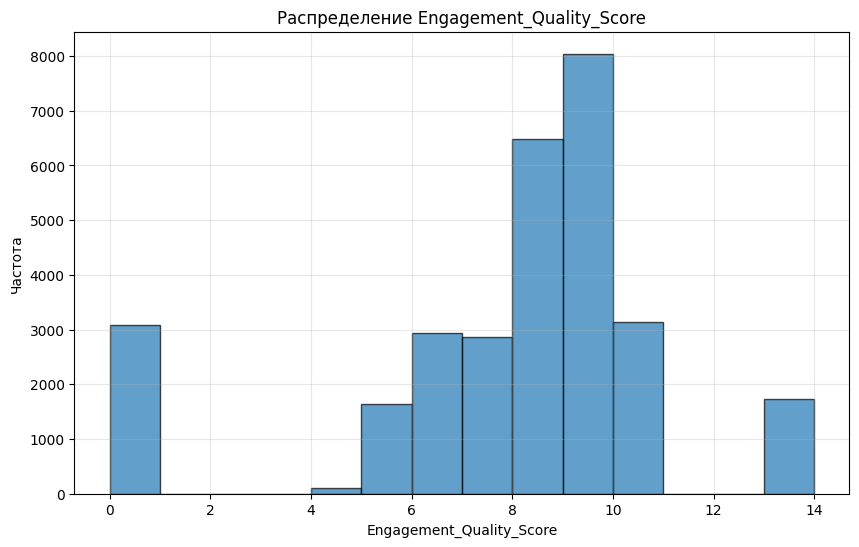

In [ ]:
plt.figure(figsize=(10, 6))
df['Engagement_Quality_Score'].hist(bins=range(0, 15), edgecolor='black', alpha=0.7)
plt.title('Распределение Engagement_Quality_Score')
plt.xlabel('Engagement_Quality_Score')
plt.ylabel('Частота')
plt.grid(True, alpha=0.3)
plt.show()

### 2. Обнаружение выбросов методом IQR

In [ ]:
def detect_outliers_iqr(data):
    Q1 = data.quantile(0.25)
    Q3 = data.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR
    return (data < lower_bound) | (data > upper_bound)

numeric_columns = ['likes', 'comments', 'shares', 'saves', 'reach', 'impressions', 'engagement_rate', 'Engagement_Quality_Score']

for column in numeric_columns:
    outliers = detect_outliers_iqr(df[column])
    print(f'Кол-во выбросов в {column} = {sum(outliers)}')

Кол-во выбросов в likes = 0
Кол-во выбросов в comments = 0
Кол-во выбросов в shares = 0
Кол-во выбросов в saves = 0
Кол-во выбросов в reach = 0
Кол-во выбросов в impressions = 0
Кол-во выбросов в engagement_rate = 2557
Кол-во выбросов в Engagement_Quality_Score = 3080


### Визуализируем выбросы с помощью диаграммы рассеивания и коробчатых диаграмм

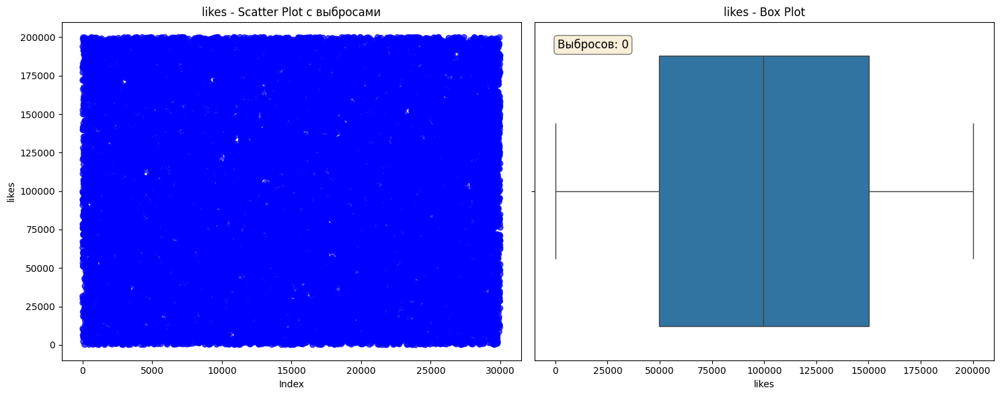

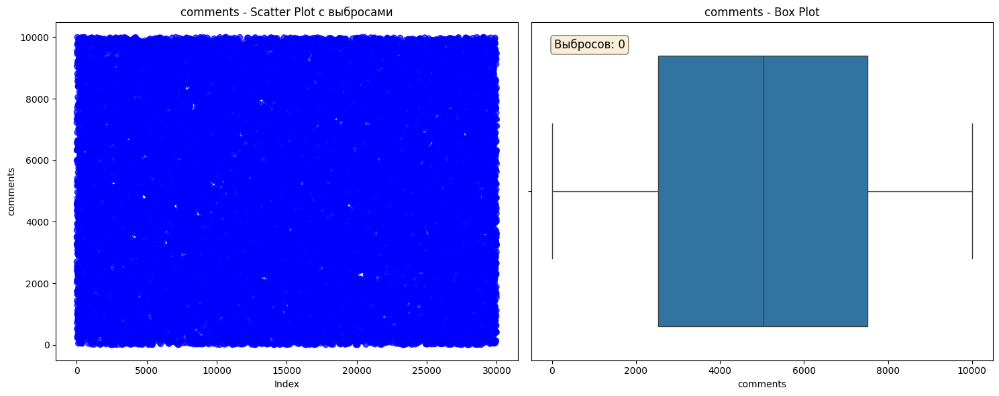

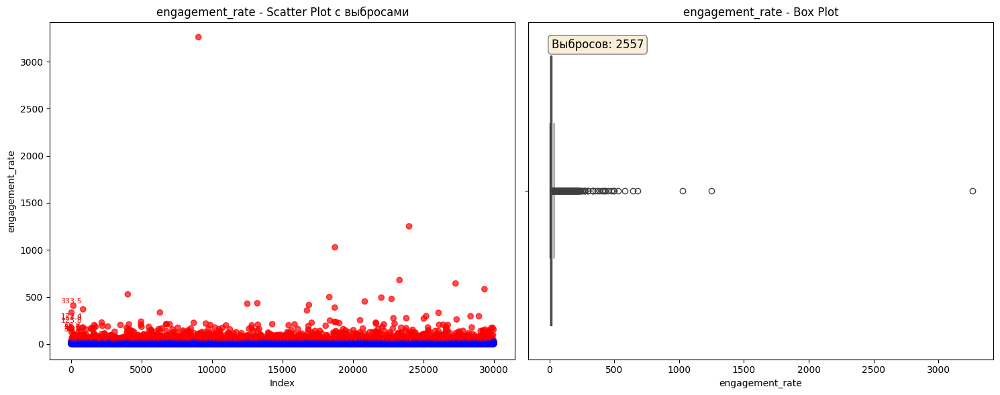


Статистика выбросов для engagement_rate:
Количество: 2557
Значения: [154.84 172.44 333.54 ...  35.08 153.6   32.55]
Индексы: [18, 21, 25, 32, 45, 65, 71, 80, 83, 88, 96, 97, 116, 120, 129, 155, 159, 186, 191, 193, 196, 198, 199, 209, 230, 248, 261, 263, 271, 301, 306, 309, 318, 334, 375, 393, 395, 402, 405, 413, 465, 469, 484, 498, 513, 523, 534, 548, 555, 567, 570, 573, 604, 619, 621, 623, 649, 692, 733, 737, 759, 771, 780, 782, 787, 791, 801, 809, 811, 812, 831, 837, 846, 853, 855, 857, 865, 873, 895, 905, 916, 926, 927, 937, 943, 963, 990, 991, 1010, 1011, 1013, 1021, 1040, 1063, 1070, 1072, 1078, 1083, 1103, 1105, 1113, 1135, 1163, 1188, 1190, 1191, 1196, 1205, 1209, 1232, 1248, 1251, 1254, 1262, 1306, 1328, 1360, 1365, 1374, 1382, 1423, 1448, 1461, 1487, 1498, 1503, 1512, 1513, 1525, 1540, 1542, 1582, 1586, 1605, 1606, 1615, 1616, 1626, 1634, 1636, 1641, 1661, 1662, 1692, 1693, 1694, 1695, 1720, 1744, 1748, 1749, 1750, 1753, 1760, 1774, 1801, 1805, 1837, 1848, 1877, 1883, 1892, 1

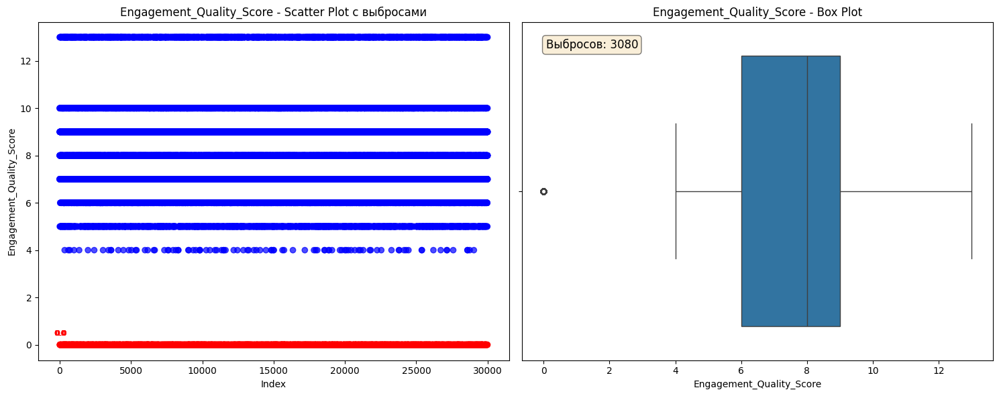


Статистика выбросов для Engagement_Quality_Score:
Количество: 3080
Значения: [0 0 0 ... 0 0 0]
Индексы: [15, 16, 23, 30, 37, 60, 65, 72, 88, 99, 119, 135, 142, 174, 182, 201, 203, 216, 239, 242, 243, 245, 265, 271, 274, 289, 291, 297, 304, 307, 313, 318, 334, 341, 345, 351, 355, 363, 365, 382, 383, 397, 401, 402, 412, 414, 415, 424, 426, 428, 447, 464, 472, 480, 488, 492, 499, 500, 503, 505, 510, 516, 533, 552, 582, 584, 606, 607, 617, 635, 643, 656, 657, 658, 664, 665, 667, 670, 677, 680, 699, 731, 741, 745, 764, 777, 778, 790, 797, 805, 806, 815, 836, 837, 850, 853, 854, 856, 869, 872, 879, 881, 882, 893, 905, 911, 924, 932, 938, 940, 950, 954, 958, 959, 971, 980, 986, 987, 996, 1017, 1028, 1035, 1040, 1053, 1056, 1084, 1086, 1097, 1114, 1123, 1128, 1130, 1158, 1165, 1167, 1168, 1172, 1197, 1200, 1213, 1215, 1219, 1221, 1229, 1241, 1244, 1250, 1253, 1279, 1280, 1291, 1299, 1304, 1309, 1344, 1353, 1356, 1361, 1362, 1390, 1400, 1402, 1411, 1426, 1429, 1441, 1461, 1463, 1465, 1469, 147

In [ ]:
attributes = [
    ('likes', detect_outliers_iqr(df['likes'])),
    ('comments', detect_outliers_iqr(df['comments'])),
    ('engagement_rate', detect_outliers_iqr(df['engagement_rate'])),
    ('Engagement_Quality_Score', detect_outliers_iqr(df['Engagement_Quality_Score']))
]

for col, outliers in attributes:
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 6))

    data = df[col]
    colors = ['blue' if not x else 'red' for x in outliers]
    ax1.scatter(range(len(data)), data, c=colors, alpha=0.7)
    ax1.set_title(f'{col} - Scatter Plot с выбросами')
    ax1.set_xlabel('Index')
    ax1.set_ylabel(col)

    outlier_indices = outliers[outliers].index
    for idx in outlier_indices[:10]:
        ax1.annotate(f'{data[idx]:.1f}',
                    (idx, data[idx]),
                    textcoords="offset points",
                    xytext=(0,10),
                    ha='center',
                    fontsize=8,
                    color='red')

    sns.boxplot(x=data, ax=ax2)
    ax2.set_title(f'{col} - Box Plot')
    ax2.set_xlabel(col)

    num_outliers = sum(outliers)
    ax2.text(0.05, 0.95, f'Выбросов: {num_outliers}',
             transform=ax2.transAxes, fontsize=12,
             verticalalignment='top',
             bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.tight_layout()
    plt.show()

    if num_outliers > 0:
        outlier_data = data[outliers]
        print(f"\nСтатистика выбросов для {col}:")
        print(f"Количество: {num_outliers}")
        print(f"Значения: {outlier_data.values}")
        print(f"Индексы: {outlier_data.index.tolist()}")
        print("-" * 100)

### Удалим те строки, где встречаются выбросы

In [ ]:
outlier_mask = pd.Series([False] * len(df))

main_metrics = ['likes', 'comments', 'shares', 'saves', 'reach', 'impressions', 'engagement_rate']

for column in main_metrics:
    column_outliers = detect_outliers_iqr(df[column])
    outlier_mask = outlier_mask | column_outliers
    print(f'Выбросов в {column}: {sum(column_outliers)}')

df_cleaned = df[~outlier_mask]
df_cleaned.to_csv('instagram_analytics_cleaned.csv', index=False)

print(f"\nИсходный размер датасета: {df.shape}")
print(f"Размер датасета после удаления выбросов: {df_cleaned.shape}")
print(f"Удалено строк с выбросами: {sum(outlier_mask)}")
print(f"Осталось строк: {len(df_cleaned)}")

engagement_outliers_after = detect_outliers_iqr(df_cleaned['Engagement_Quality_Score'])
print(f"\nEngagement_Quality_Score выбросов осталось: {sum(engagement_outliers_after)}")



Выбросов в likes: 0
Выбросов в comments: 0
Выбросов в shares: 0
Выбросов в saves: 0
Выбросов в reach: 0
Выбросов в impressions: 0
Выбросов в engagement_rate: 2557

Исходный размер датасета: (29999, 16)
Размер датасета после удаления выбросов: (27442, 16)
Удалено строк с выбросами: 2557
Осталось строк: 27442

Engagement_Quality_Score выбросов осталось: 2799


##3. Построение графиков зависимости

### Матрица диаграмм рассеяния для всех числовых переменных

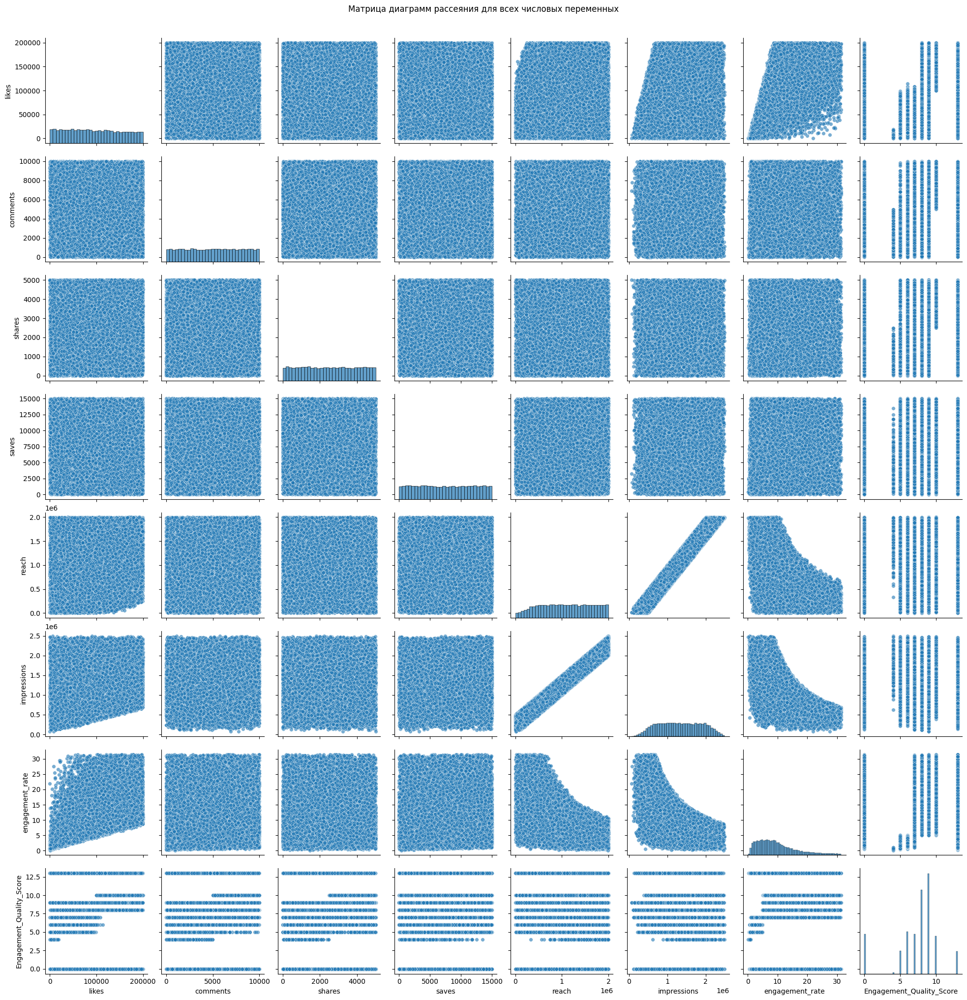

In [ ]:
numeric_columns_for_plots = ['likes', 'comments', 'shares', 'saves', 'reach', 'impressions', 'engagement_rate', 'Engagement_Quality_Score']

sns.pairplot(df_cleaned[numeric_columns_for_plots],
             diag_kind='hist',
             plot_kws={'alpha': 0.6, 's': 30},
             diag_kws={'alpha': 0.7})
plt.suptitle('Матрица диаграмм рассеяния для всех числовых переменных', y=1.02)
plt.show()

### Рассмотрим графики корреляции Engagement_Quality_Score и других значений

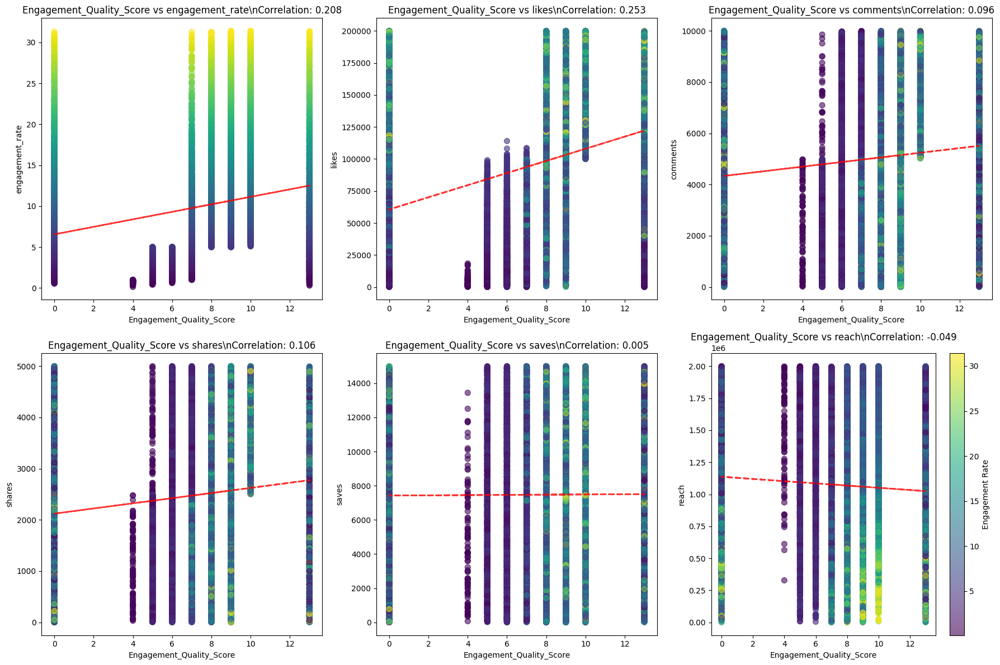

In [ ]:
key_pairs = [
    ('Engagement_Quality_Score', 'engagement_rate'),
    ('Engagement_Quality_Score', 'likes'),
    ('Engagement_Quality_Score', 'comments'),
    ('Engagement_Quality_Score', 'shares'),
    ('Engagement_Quality_Score', 'saves'),
    ('Engagement_Quality_Score', 'reach'),
]

fig, axes = plt.subplots(2, 3, figsize=(18, 12))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(key_pairs):
    scatter = axes[i].scatter(df_cleaned[x_col], df_cleaned[y_col], alpha=0.6, c=df_cleaned['engagement_rate'],
                             cmap='viridis', s=50)
    axes[i].set_xlabel(x_col)
    axes[i].set_ylabel(y_col)

    # Добавляем линию тренда
    z = np.polyfit(df_cleaned[x_col], df_cleaned[y_col], 1)
    p = np.poly1d(z)
    axes[i].plot(df_cleaned[x_col], p(df_cleaned[x_col]), "r--", alpha=0.8, linewidth=2)

    corr = df_cleaned[x_col].corr(df_cleaned[y_col])
    axes[i].set_title(f'{x_col} vs {y_col}\\nCorrelation: {corr:.3f}')

    if i == len(key_pairs) - 1:
        cbar = plt.colorbar(scatter, ax=axes[i])
        cbar.set_label('Engagement Rate')

plt.tight_layout()
plt.show()

## 4. Применение метода KMeans

### Определение оптимального числа кластеров методом локтя

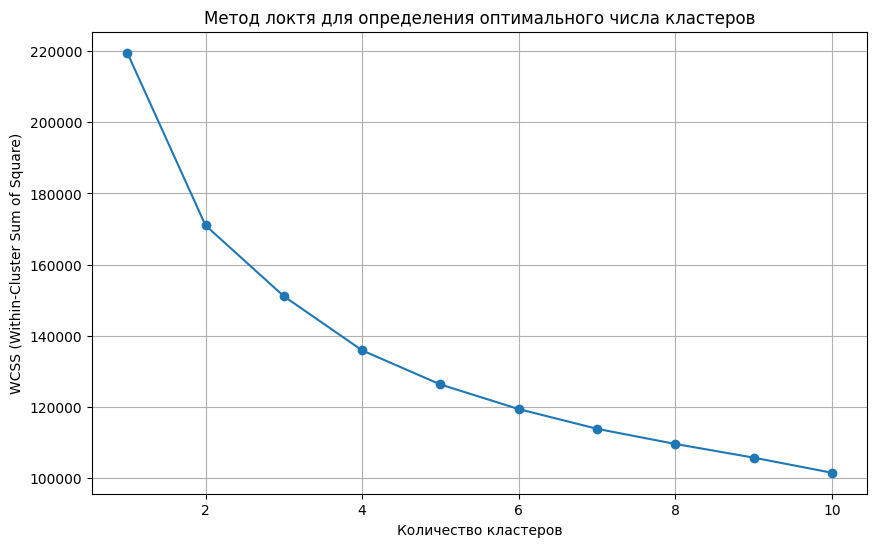

In [ ]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_cleaned[numeric_columns_for_plots])

wcss = []
for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, random_state=42, n_init=10)
    kmeans.fit(X_scaled)
    wcss.append(kmeans.inertia_)

plt.figure(figsize=(10, 6))
plt.plot(range(1, 11), wcss, marker='o')
plt.xlabel('Количество кластеров')
plt.ylabel('WCSS (Within-Cluster Sum of Square)')
plt.title('Метод локтя для определения оптимального числа кластеров')
plt.grid(True)
plt.show()

### Применение K-means с оптимальным числом кластеров

In [ ]:
kmeans = KMeans(n_clusters=4, random_state=42, n_init=10)
clusters = kmeans.fit_predict(X_scaled)
df_cleaned['Cluster'] = clusters

print("Кластеризация завершена")
print(f"Размеры кластеров:")
print(df_cleaned['Cluster'].value_counts().sort_index())

Кластеризация завершена
Размеры кластеров:
Cluster
0    8101
1    6630
2    6218
3    6493
Name: count, dtype: int64


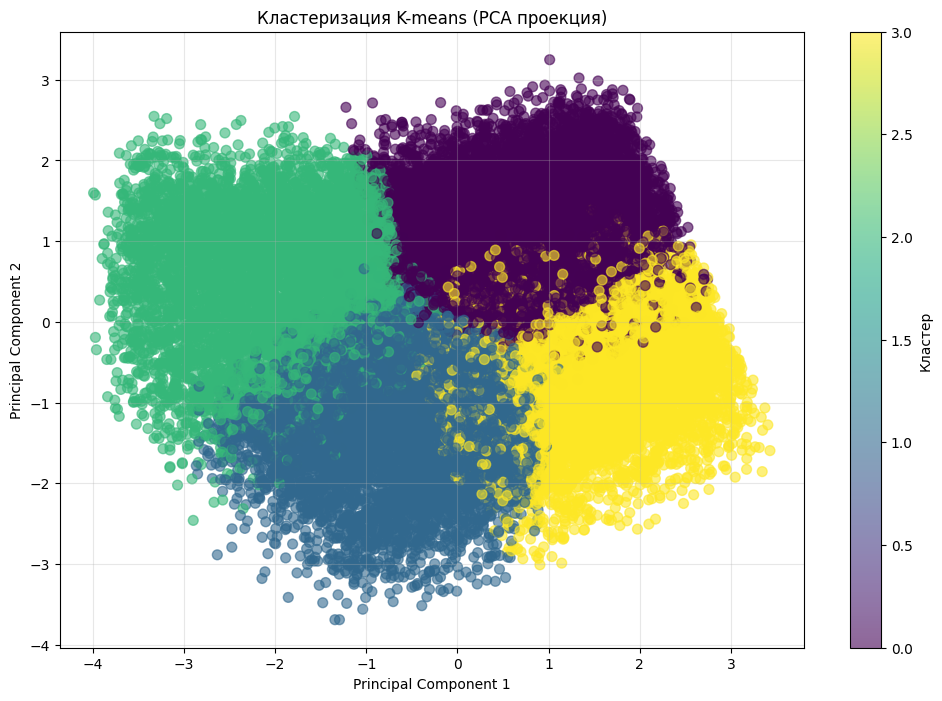

In [ ]:
# Визуализация кластеров в 2D пространстве (первые 2 главные компоненты)
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

plt.figure(figsize=(12, 8))
scatter = plt.scatter(X_pca[:, 0], X_pca[:, 1], c=df_cleaned['Cluster'], cmap='viridis', alpha=0.6, s=50)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Кластеризация K-means (PCA проекция)')
plt.grid(True, alpha=0.3)
plt.show()

<Figure size 1500x1200 with 0 Axes>

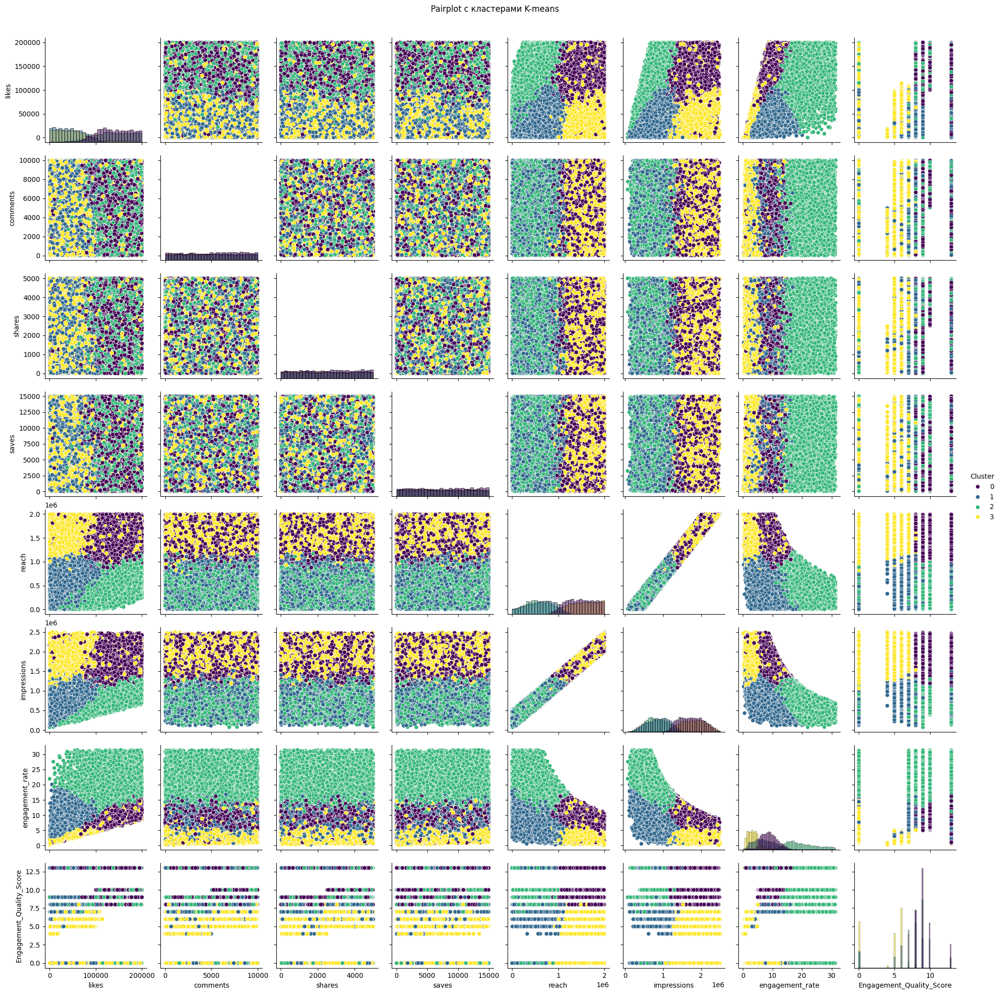

In [ ]:
# Pairplot с кластерами
plt.figure(figsize=(15, 12))
sns.pairplot(df_cleaned, vars=numeric_columns_for_plots, hue='Cluster', palette='viridis', diag_kind='hist')
plt.suptitle('Pairplot с кластерами K-means', y=1.02)
plt.show()

### Визуализация кластеров на ключевых парах признаков

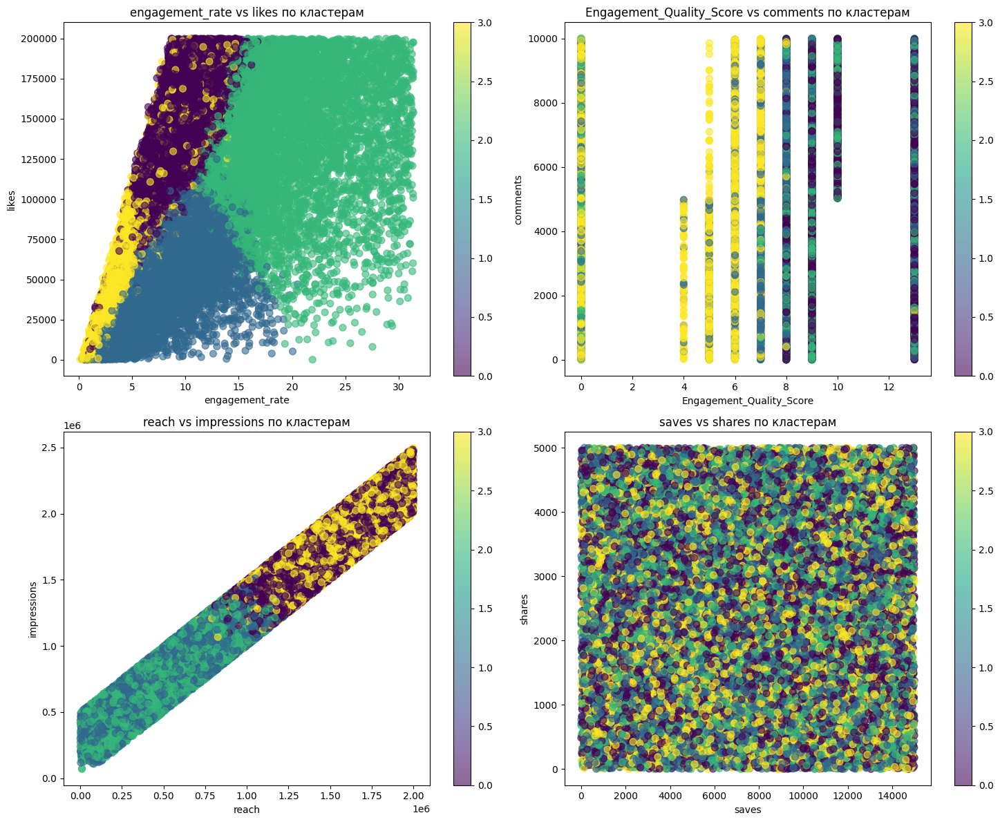

In [ ]:
# Ключевые пары для визуализации кластеров
key_pairs_clusters = [
    ('engagement_rate', 'likes'),
    ('Engagement_Quality_Score', 'comments'),
    ('reach', 'impressions'),
    ('saves', 'shares')
]

fig, axes = plt.subplots(2, 2, figsize=(15, 12))
axes = axes.flatten()

for i, (x_col, y_col) in enumerate(key_pairs_clusters):
    scatter = axes[i].scatter(df_cleaned[x_col], df_cleaned[y_col], c=df_cleaned['Cluster'],
                             cmap='viridis', alpha=0.6, s=50)
    axes[i].set_xlabel(x_col)
    axes[i].set_ylabel(y_col)
    axes[i].set_title(f'{x_col} vs {y_col} по кластерам')
    plt.colorbar(scatter, ax=axes[i])

plt.tight_layout()
plt.show()

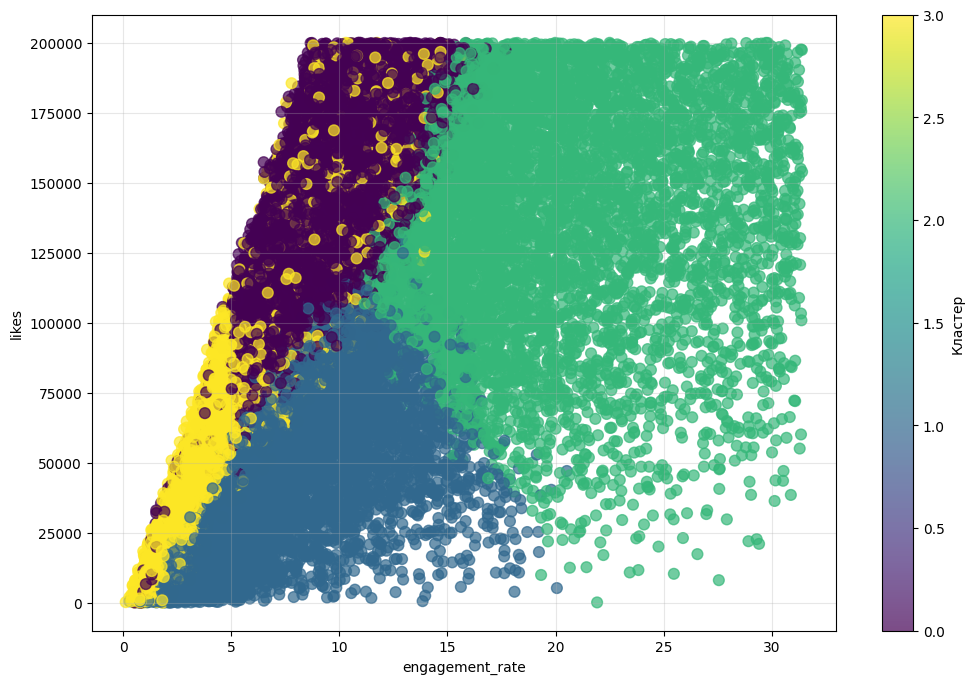

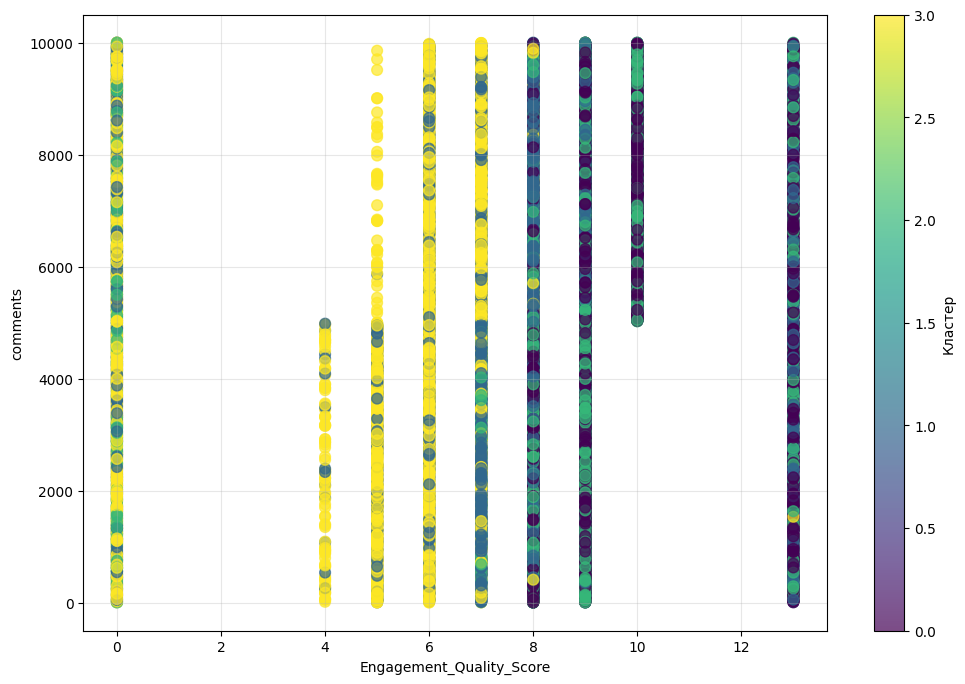

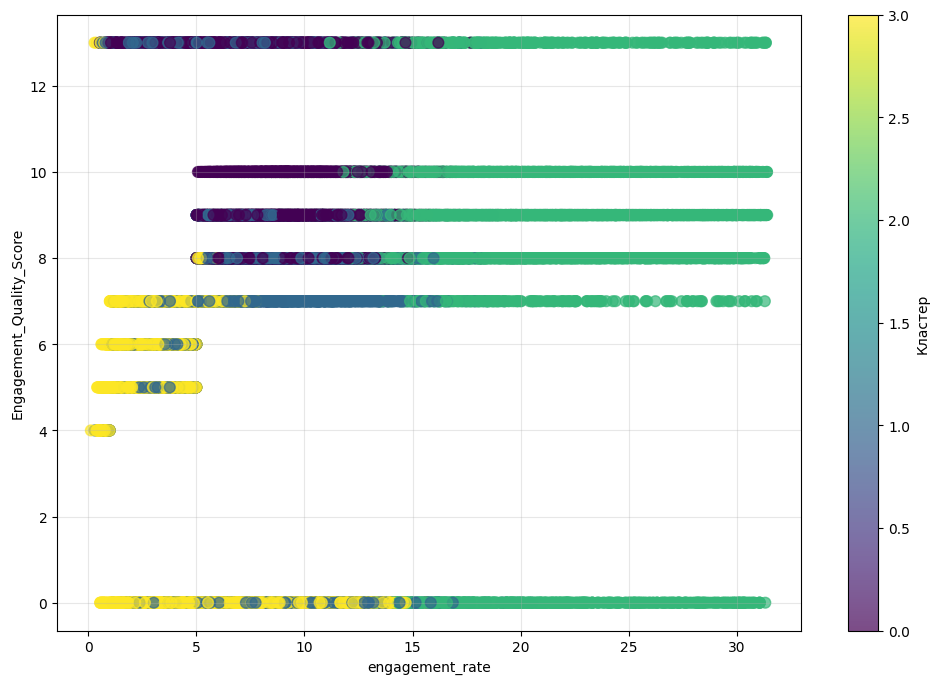

In [ ]:
#scatter plot с кластерами
plt.figure(figsize=(12, 8))
scatter = plt.scatter(df_cleaned['engagement_rate'],
                     df_cleaned['likes'],
                     c=df_cleaned['Cluster'],
                     cmap='viridis',
                     alpha=0.7,
                     s=60)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('engagement_rate')
plt.ylabel('likes')
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(12, 8))
scatter = plt.scatter(df_cleaned['Engagement_Quality_Score'],
                     df_cleaned['comments'],
                     c=df_cleaned['Cluster'],
                     cmap='viridis',
                     alpha=0.7,
                     s=60)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('Engagement_Quality_Score')
plt.ylabel('comments')
plt.grid(True, alpha=0.3)
plt.show()

plt.figure(figsize=(12, 8))
scatter = plt.scatter(df_cleaned['engagement_rate'],
                     df_cleaned['Engagement_Quality_Score'],
                     c=df_cleaned['Cluster'],
                     cmap='viridis',
                     alpha=0.7,
                     s=60)
plt.colorbar(scatter, label='Кластер')
plt.xlabel('engagement_rate')
plt.ylabel('Engagement_Quality_Score')
plt.grid(True, alpha=0.3)
plt.show()

df_cleaned.to_csv('instagram_analytics_with_clusters.csv', index=False)

### Вывод

#### В рамках исследования в датасет был введен новый показатель — Engagement_Quality_Score, демонстрирующий зависимость от уровня вовлеченности (engagement_rate), лайков, комментариев и количества поделившихся. После целенаправленного добавления и последующей очистки данных от 'грязных данных' с помощью метода K-means было выделено четыре кластера контента, каждый из которых обладает уникальными показателями эффективности.